In [2]:
import os
import re
import pickle
import torch
import jsonlines

from typing import List, Optional, Tuple, Union

import sys
sys.path.append("/lid/home/saydalie/multimodal_cot")
sys.path.append("/lid/home/saydalie/multimodal_cot/anole")

import pandas as pd
from PIL import Image

from transformers import ChameleonForCausalLM, ChameleonProcessor
from anole.chameleon.inference.chameleon import TokenManager

from anole.constants import (
    TOKENIZER_TEXT_PATH,
    TOKENIZER_IMAGE_CFG_PATH,
    TOKENIZER_IMAGE_PATH,
)

from training.constants_training import (
    ANOLE_PATH_HF,
    ANOLE_PATH_HF_TRAINED,
    RESULTS_DIR,
    DATASET_RAW_DIR,
    DATASET_TOKENIZED_DIR
)

In [ ]:
pattern_names = ["circle_size_number", "color_number_hexagon", "grid_number", "polygon_sides_number", "shape_morph", "shape_size_hexagon", "triangle", 'color_grid', 'color_overlap_squares', 'grid_number_color', 'rectangle_height_color', 'shape_reflect', "size_cycle", 'venn', 'color_hexagon', 'color_size_circle', 'polygon_sides_color', 'rectangle_height_number', 'shape_size_grid', "size_grid"]
pattern_names_in_domain = ['color_number_hexagon', 'grid_number_color', 'rectangle_height_color', 'polygon_sides_number', 'triangle']

# Accuracy

In [24]:
output_dir = RESULTS_DIR / "Anole-7B-5DS-CE-txt/final"

results = []
for pattern_name in pattern_names:
    output = pd.read_json(output_dir / f"{pattern_name}.jsonl", lines=True)
    acc = (output['answer'] == output['answer_predicted']).mean()
    results.append({'pattern_name': pattern_name, "accuracy": acc})

results = pd.DataFrame(results)
results['in_domain'] = results['pattern_name'].apply(lambda x: True if x in pattern_names_in_domain else False)

results.sort_values(by=['in_domain', 'accuracy'], ascending=False)

,pattern_name,accuracy,in_domain
10,rectangle_height_color,0.98,True
3,polygon_sides_number,0.78,True
9,grid_number_color,0.69,True
1,color_number_hexagon,0.66,True
6,triangle,0.61,True
15,color_size_circle,0.35,False
5,shape_size_hexagon,0.29,False
14,color_hexagon,0.29,False
18,shape_size_grid,0.29,False
16,polygon_sides_color,0.28,False


In [25]:
output_dir = RESULTS_DIR / "Anole-7B-5DS-CE/final"

results = []
for pattern_name in pattern_names:
    output = pd.read_json(output_dir / f"{pattern_name}.jsonl", lines=True)
    acc = (output['answer'] == output['answer_predicted']).mean()
    results.append({'pattern_name': pattern_name, "accuracy": acc})

results = pd.DataFrame(results)
results['in_domain'] = results['pattern_name'].apply(lambda x: True if x in pattern_names_in_domain else False)

results.sort_values(by=['in_domain', 'accuracy'], ascending=False)

,pattern_name,accuracy,in_domain
10,rectangle_height_color,0.90,True
3,polygon_sides_number,0.69,True
9,grid_number_color,0.61,True
6,triangle,0.41,True
1,color_number_hexagon,0.26,True
7,color_grid,0.47,False
14,color_hexagon,0.34,False
16,polygon_sides_color,0.29,False
18,shape_size_grid,0.15,False
4,shape_morph,0.14,False


# Image generation

In [36]:
PAD_TOKEN_ID = 1

class TokenizedDataset(Dataset):
    def __init__(self, data_dir, pattern_names, start_idx=0, end_idx=9999):
        self.tokenized_data = []

        for pattern_name in pattern_names:
            data_file_path = os.path.join(data_dir, f"{pattern_name}.jsonl")

            with jsonlines.open(data_file_path) as reader:
                for idx, obj in enumerate(reader):
                    if (idx < start_idx) or (idx > end_idx):
                        continue

                    self.tokenized_data.append(torch.tensor(obj['input_text_ids'], dtype=torch.long))
    
    def __len__(self):
        return len(self.tokenized_data)
    
    def __getitem__(self, idx):
        return self.tokenized_data[idx]

# Define custom collate function
def collate_fn(batch):
    # pad_id = 1
    # left padding
    batch_flipped = [item.flip(0) for item in batch]
    batch_inputs_padded = pad_sequence(batch_flipped, batch_first=True, padding_value=PAD_TOKEN_ID).flip(1)
    
    # Create attention mask
    attention_mask = (batch_inputs_padded != PAD_TOKEN_ID).long()

    return {'input_ids': batch_inputs_padded, 'attention_mask': attention_mask}
    
def split_token_sequence(
    tokens: torch.LongTensor,
    boi: int,
    eoi: int
) -> List[Tuple[str, torch.LongTensor]]:
    """
    Split a sequence of tokens into text and image segments.
    
    Args:
        tokens (torch.LongTensor): The token sequence.
        boi (int): Begin of image token.
        eoi (int): End of image token.
    
    Returns:
        List[Tuple[str, torch.LongTensor]]: List of tuples indicating segment type and tokens.
    """
    batch_size, _ = tokens.shape
    assert batch_size == 1, "Batch size must be 1"
    
    device = tokens.device
    tokens = tokens[0]  # remove batch dimension
    tokens = tokens.to(device)
    segments = []
    current_segment = []
    in_image_seg = False

    for token in tokens:
        if token == boi:
            # if entering an image segment, save the current text segment (if any)
            if current_segment:
                segments.append(("text_seg", torch.tensor(current_segment, dtype=tokens.dtype, device=device).reshape(1, -1)))
                current_segment = []
            in_image_seg = True
        elif token == eoi and in_image_seg:
            # if exiting an image segment, save the current image segment
            segments.append(("image_seg", torch.tensor(current_segment, dtype=tokens.dtype, device=device).reshape(1, -1)))
            current_segment = []
            in_image_seg = False
        else:
            current_segment.append(token)
    # save any remaining tokens
    if current_segment:
        if in_image_seg:
            segments.append(("image_seg", torch.tensor(current_segment, dtype=tokens.dtype, device=device).reshape(1, -1)))
        else:
            segments.append(("text_seg", torch.tensor(current_segment, dtype=tokens.dtype, device=device).reshape(1, -1)))
    return segments

In [42]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_path = "Anole-7B-5DS-CE/final"

model = ChameleonForCausalLM.from_pretrained(
    ANOLE_PATH_HF_TRAINED / model_path,
    torch_dtype=torch.bfloat16
)
model.to(device)
model.eval()

token_manager = TokenManager(
    tokenizer_path = TOKENIZER_TEXT_PATH.as_posix(),
    vqgan_cfg_path = TOKENIZER_IMAGE_CFG_PATH.as_posix(),
    vqgan_ckpt_path = TOKENIZER_IMAGE_PATH.as_posix(),
    device = device
)

VQModel loaded from /lid/home/saydalie/multimodal_cot/Anole-7b-v0.1/tokenizer/vqgan.ckpt


In [54]:
def generate_and_decode(pattern_name):
    eval_dataset = TokenizedDataset(
        data_dir=os.path.join(DATASET_TOKENIZED_DIR, "eval"),
        pattern_names=[pattern_name]
    )
    
    eval_dataloader = DataLoader(
        dataset=eval_dataset,
        batch_size=1,
        collate_fn=collate_fn,
        shuffle=False
    )

    for item in eval_dataloader:
        break

    # generate
    with torch.no_grad():
        generate_ids = model.generate(
            input_ids = item['input_ids'].to(device),
            attention_mask = item['attention_mask'].to(device),
            max_length = 6144,
            do_sample=False,
            pad_token_id=PAD_TOKEN_ID
        )

    segments = split_token_sequence(generate_ids[0].unsqueeze(0), boi=8197, eoi=8196)
    
    # decode
    for seg_id, (seg_type, seg_tokens) in enumerate(segments):
        if seg_type == "image_seg":
            if seg_tokens.shape[1] != 1024:
                print(f"[WRONG IMAGE TOKENS SIZE: {seg_tokens.shape[1]}]")
                continue
            img: Image = token_manager.decode_image(seg_tokens)[0]
            img.show()
        else:
            assert seg_type == "text_seg"
            decoded_text = token_manager.decode_text(seg_tokens)[0]
            print(decoded_text)

## In-domain

### color_number_hexagon

# Question:



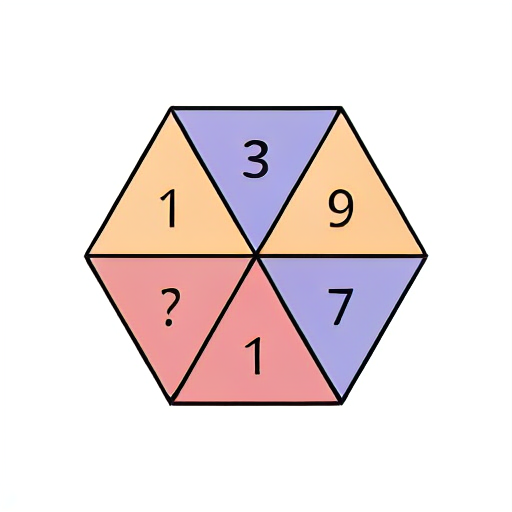

What is the missing number of the part denoted with a question mark?

# Options:
(A) 4
(B) 9
(C) 2
(D) 1

# Pattern:
There is a hexagon split into six parts with the colors ['purple', 'red', 'orange', 'orange', 'purple', 'red'] in an anti-clockwise order. The parts are denoted with the numbers [3, 1, '?', 1, 7, 9] respectively. We observe that the numbers in the orange parts add up to 10. Similarly, the numbers in the purple parts also add up to 10. Thus, the pattern is that the numbers in the parts of the same color add up to 10.

# Option A
Replacing '?' with 4: 


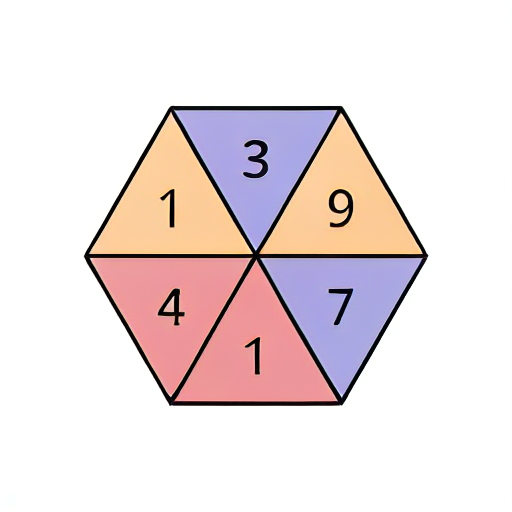


Reasoning: Comparing the sum of the numbers of the parts with the same color, it does not fit the observed pattern. 4 is unlikely to be the correct answer.

# Option B
Replacing '?' with 9: 


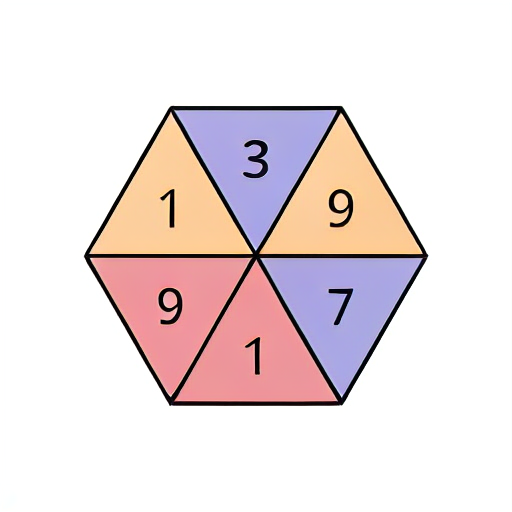


Reasoning: Comparing the sum of the numbers of the parts with the same color, it does not fit the observed pattern. 9 is unlikely to be the correct answer.

# Option C
Replacing '?' with 2: 


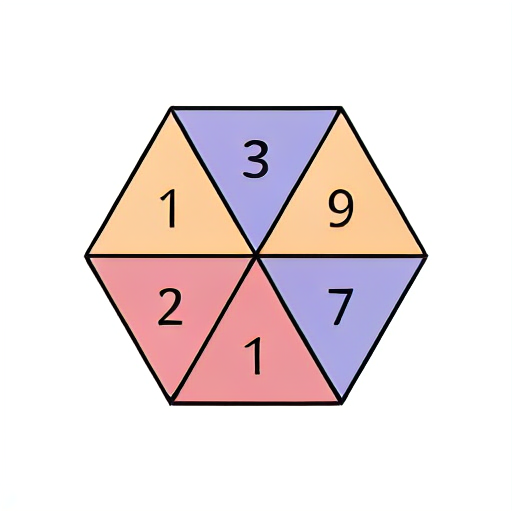


Reasoning: Comparing the sum of the numbers of the parts with the same color, it matches well the observed pattern. 2 is a strong candidate for the correct answer.

# Option D
Replacing '?' with 1: 


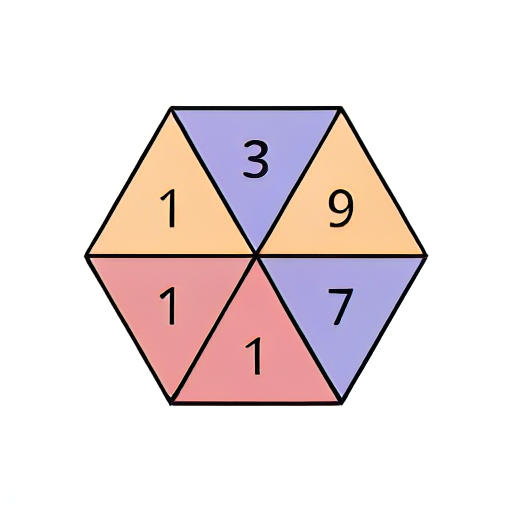


Reasoning: Comparing the sum of the numbers of the parts with the same color, it does not fit the observed pattern. 1 is unlikely to be the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is 2. The pattern that the numbers in the parts of the same color add up to 10, holds consistently when we replace '?' with 2. Therefore, among (A) (B) (C) (D), the answer is: (C).


In [45]:
generate_and_decode('color_number_hexagon')

### grid_number_color

# Question:



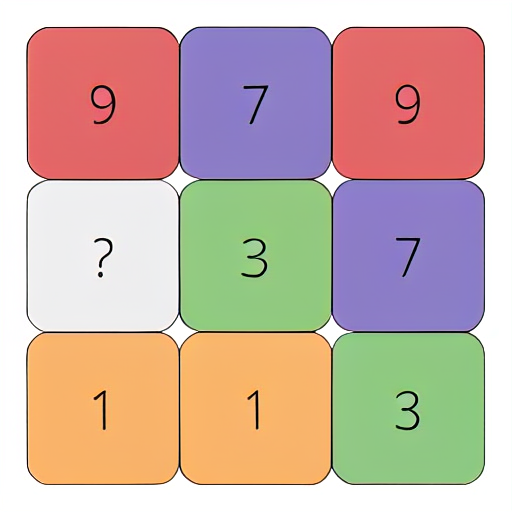

What is the missing color if the part denoted with the question mark has the number 3?

# Options:
(A) red
(B) purple
(C) green
(D) orange

# Pattern:
There is a 3x3 colored grid of numbers. The first row has number-color pair [(9, 'red'), (7, 'purple'), (3, 'orange')], the second row is [(9, 'red'), (1, 'green'), (7, 'purple')], and the third and final row is [(3, '?'), (1, 'green'), (3, 'orange')]. We observe that the grid cells with number 7 is purple in color, the grid cells with number 1 is green in color, the grid cells with number 9 is red in color, and the grid cells with number 3 is orange in color. Thus, the pattern is that the grid cell with the same number will have the same color.

# Option A
Replacing '?' with red: 


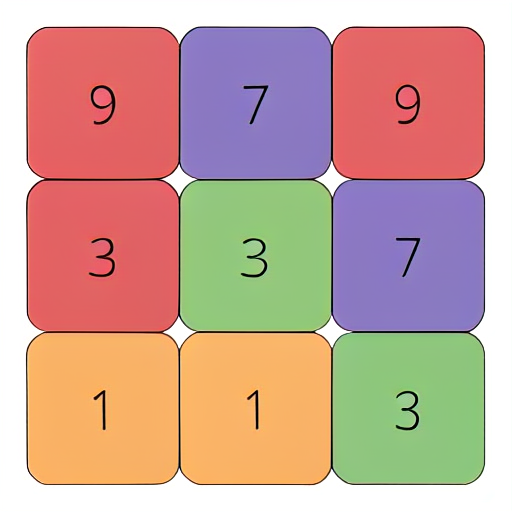


Reasoning: Comparing the sum of each row, it does not fit the observed pattern. red is unlikely to be the correct answer.

# Option B
Replacing '?' with purple: 


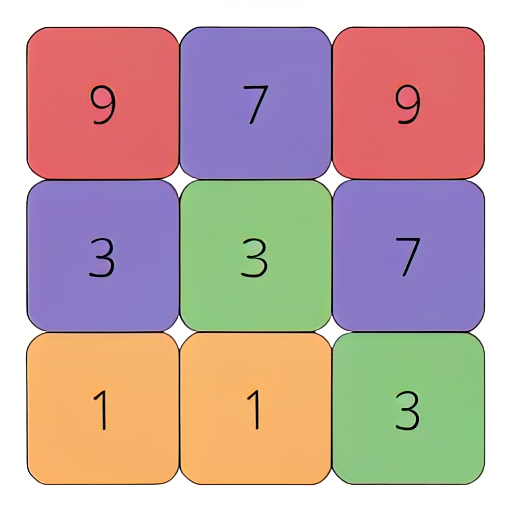


Reasoning: Comparing the sum of each row, it does not fit the observed pattern. purple is unlikely to be the correct answer.

# Option C
Replacing '?' with green: 


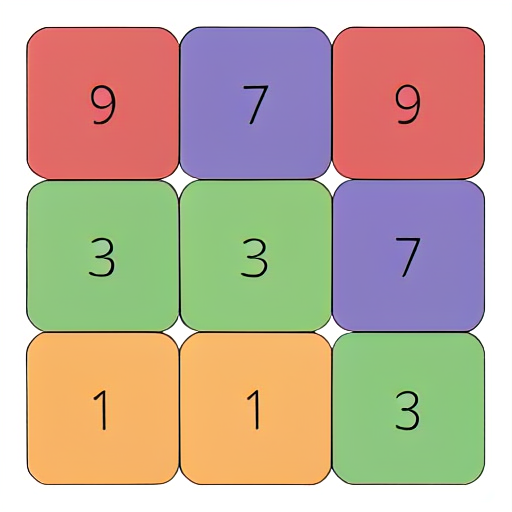


Reasoning: Comparing the sum of each row, it does not fit the observed pattern. green is unlikely to be the correct answer.

# Option D
Replacing '?' with orange: 


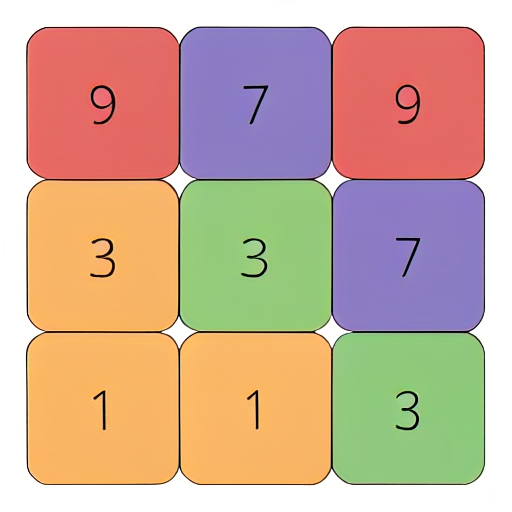


Reasoning: Comparing the sum of each row, it matches well the pattern, that is each row adds up to the same value. orange is a strong candidate for the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is orange. The pattern that the numbers in each row addding up to the same value holds consistently when we replace '?' with orange. Therefore, among (A) (B) (C) (D), the answer is: (D).


In [46]:
generate_and_decode('grid_number_color')

### rectangle_height_color

# Question:



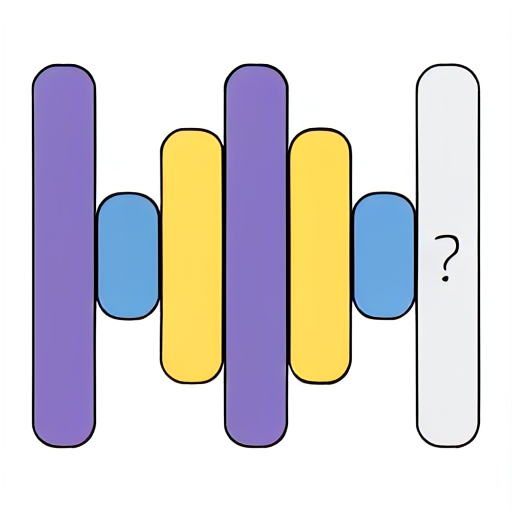

What is the missing color of the part denoted with a question mark?

# Options:
(A) green
(B) purple
(C) yellow
(D) orange

# Pattern:
There are 7 rectangles in the image with varying colors and lengths. The lengths from left to right are ['long', 'short', 'medium', 'long', 'medium', 'short', 'long']. The colors from left to right are ['purple', 'blue', 'yellow', 'purple', 'yellow', 'blue', '?']. We observe that the blue rectangles are of short length and the yellow rectangles are of medium length. Hence, the pattern is that the color of each rectangle corresponds to its length.

# Option A
Replacing '?' with green: 


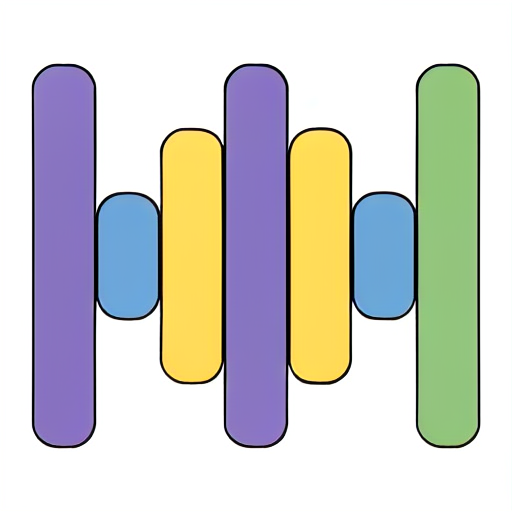


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. green is unlikely to be the correct answer.

# Option B
Replacing '?' with purple: 


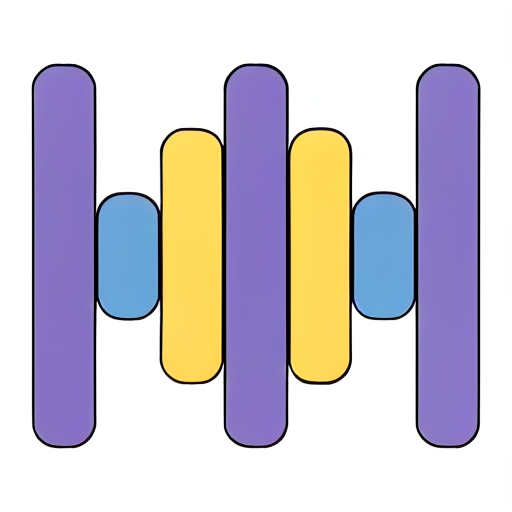


Reasoning: Comparing the color of each rectangle to its length, it matches well the color-length pattern. purple is a strong candidate for the correct answer.

# Option C
Replacing '?' with yellow: 


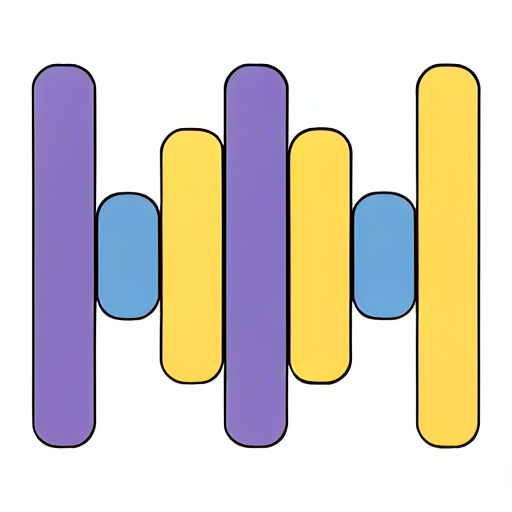


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. yellow is unlikely to be the correct answer.

# Option D
Replacing '?' with orange: 


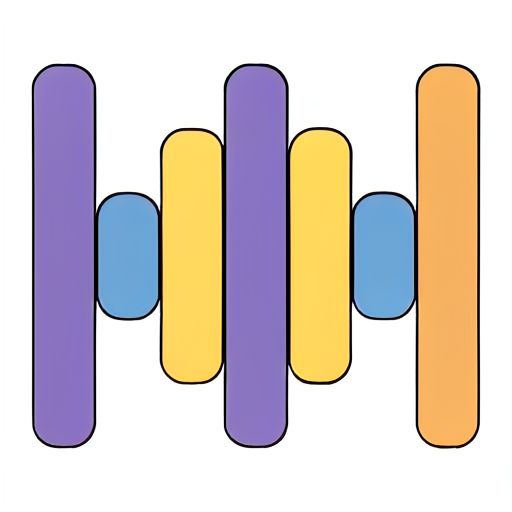


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. orange is unlikely to be the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is purple. The pattern that the color of each rectangle corresponds to its length holds consistently when we replace '?' with purple. Therefore, among (A) (B) (C) (D), the answer is: (B).


In [47]:
generate_and_decode('rectangle_height_color')

### polygon_sides_number

# Question:



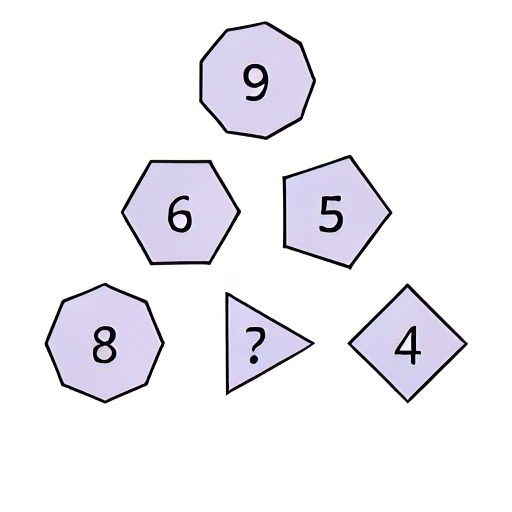

What is the missing number of the part denoted with a question mark?

# Options:
(A) 3
(B) 6
(C) 9
(D) 7

# Pattern:
There are 6 numbered polygons arranged in a triangle with number [9] in the top row, [6, 5] in the middle row, and [8, '?', 4] in the bottom row. We observe that the polygon with 9 sides has the number 9, the polygon with 6 sides has the number 6, the polygon with 8 sides has the number 8, the polygon with 4 sides has the number 4, and the polygon with 5 sides has the number 5. Thus, the pattern is that the number inside the polygon represents the number of sides the polygon has.

# Option A
Replacing '?' with 3: 


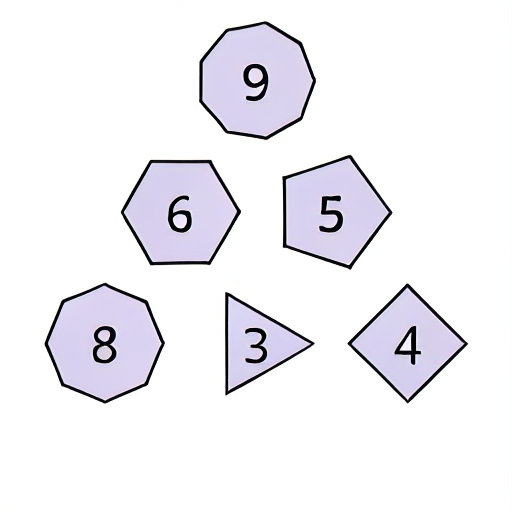


Reasoning: Comparing the number of sides of each polygon to the number inside them, it matches well the side-to-number pattern. 3 is a strong candidate for the correct answer.

# Option B
Replacing '?' with 6: 


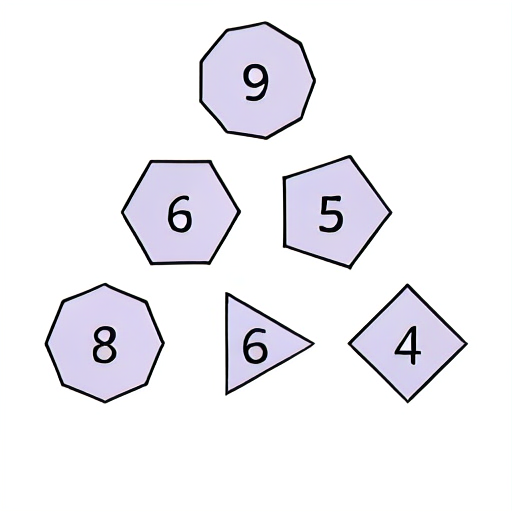


Reasoning: Comparing the number of sides of each polygon to the number inside them, it does not fit the observed side-to-number pattern. 6 is unlikely to be the correct answer.

# Option C
Replacing '?' with 9: 


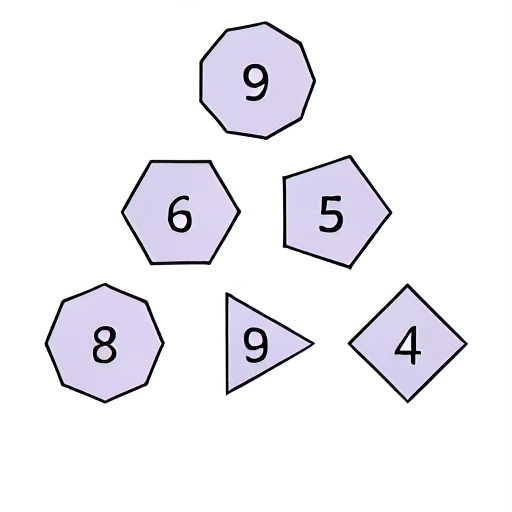


Reasoning: Comparing the number of sides of each polygon to the number inside them, it does not fit the observed side-to-number pattern. 9 is unlikely to be the correct answer.

# Option D
Replacing '?' with 7: 


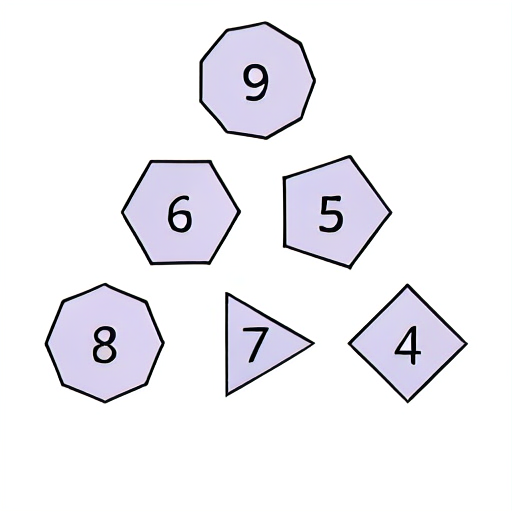


Reasoning: Comparing the number of sides of each polygon to the number inside them, it does not fit the observed side-to-number pattern. 7 is unlikely to be the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is 3. The pattern that the number inside the polygon represents the number of sides of the polygon holds consistently when we replace '?' with 3. Therefore, among (A) (B) (C) (D), the answer is: (A).


In [48]:
generate_and_decode('polygon_sides_number')

### triangle

# Question:



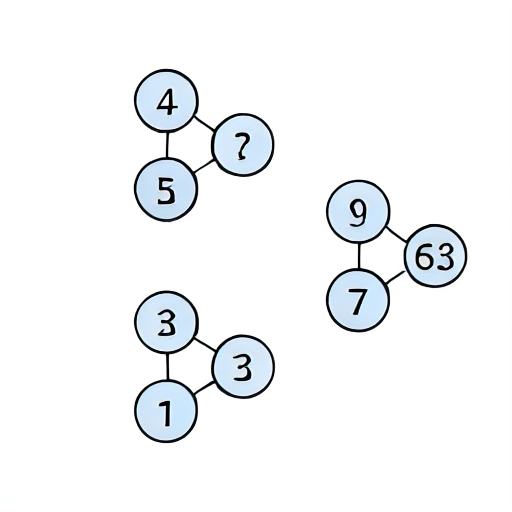

What is the missing number of the part denoted with a question mark?

# Options:
(A) 62
(B) 46
(C) 39
(D) 20

# Pattern:
There are three groups of numbers with a triangle arrangement in the image. The first group is [4, 3, '?'], the second group is [5, 1, 5], and the third group is [9, 7, 63]. We observe that the number 5 is the product of 1 and 5. Similarly, the number 63 is the product of 7 and 9. Hence, the pattern is that the rightmost number in each group is the product of the other two numbers.

# Option A
Replacing '?' with 62: 


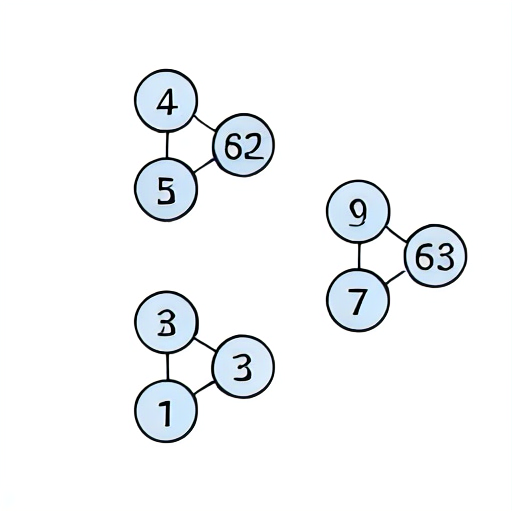


Reasoning: Comparing the rightmost number of each group to the product of the other two numbers, it does not fit the observed pattern. 62 is unlikely to be the correct answer.

# Option B
Replacing '?' with 46: 


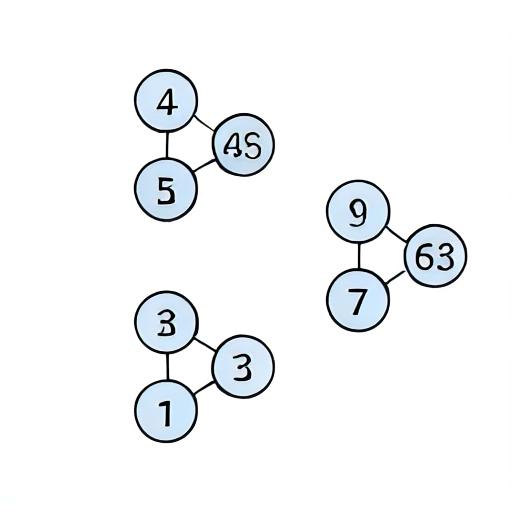


Reasoning: Comparing the rightmost number of each group to the product of the other two numbers, it does not fit the observed pattern. 46 is unlikely to be the correct answer.

# Option C
Replacing '?' with 39: 


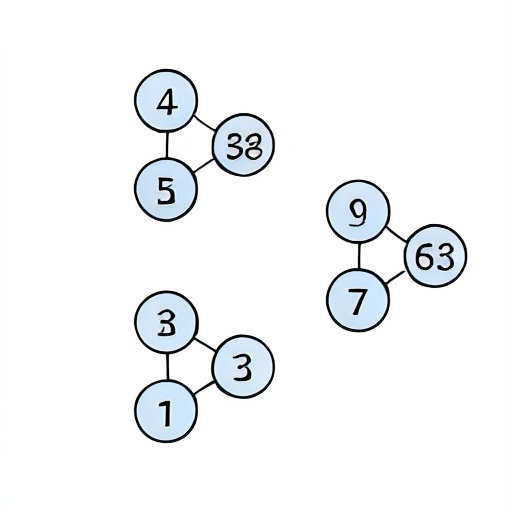


Reasoning: Comparing the rightmost number of each group to the product of the other two numbers, it matches well the observed pattern. 39 is a strong candidate for the correct answer.

# Option D
Replacing '?' with 20: 


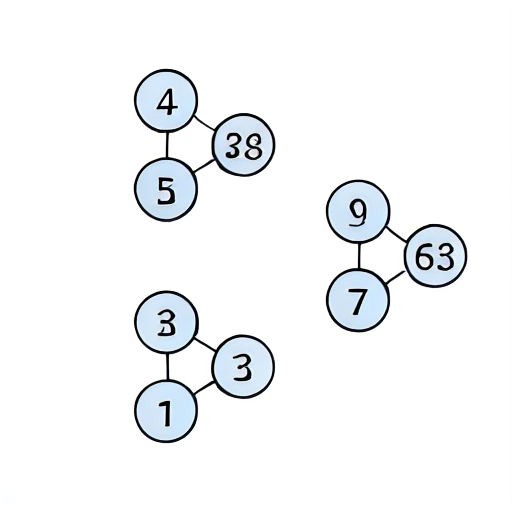


Reasoning: Comparing the rightmost number of each group to the product of the other two numbers, it does not fit the observed pattern. 20 is unlikely to be the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is 39. The pattern that the rightmost number in each group is the product of the other two numbers holds consistently when we replace '?' with 39. Therefore, among (A) (B) (C) (D), the answer is: (C).


In [49]:
generate_and_decode('triangle')

## Out-of-domain

### circle_size_number

# Question:



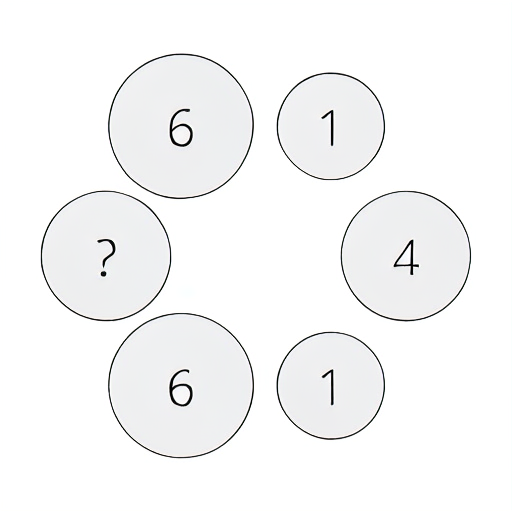

What is the missing number of the part denoted with a question mark?

# Options:
(A) 6
(B) 3
(C) 4
(D) 2

# Pattern:
There are 6 numbered polygons in the image with varying numbers of triangles. The polygons in the left side have a triangle and the number in it is either 6 or 4. Similarly, the polygon in the right side has 4 triangles and the number is 6. The polygon in the middle has 4 triangles and 6 is the number. Thus, the pattern is that the number is the number of triangles in the polygon.

# Option A
Replacing '?' with 6: 


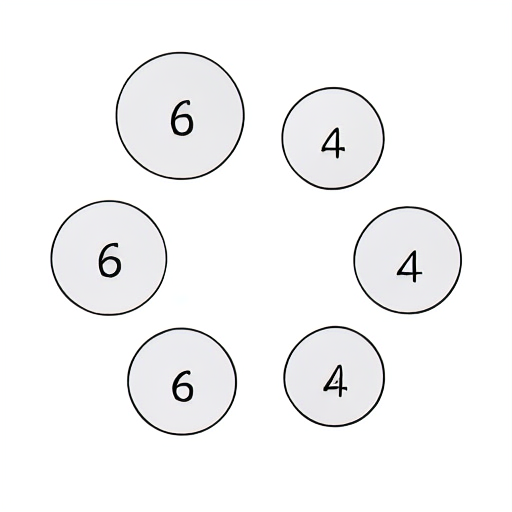


Reasoning: Comparing the number of triangles in each polygon: 6 is a good fit for theinger
Reasoning: This is a process-based reasoning problem. Weyalty: None: The number in the symbol is unlikely to be pcpartpicker(): 67: 6: 6: : 6: 2: 2: '2' is the best fit for the missing number.

pattern: : '1' is theyalty: None: '6': 6: 6: : 6: 2: 2: The number in the rectangle is unlikely to be '2'. According to the pattern, the number in the rectangle is 6.

reasoning: 1: 1: : 1: : 1: 1: The pattern is that the number in the left side is the number of triangles in the polygon. 6: 6: 6: : 6: 6: 6: The number in the right side is the number of triangles in the polygon. 6: 6: 6: : 6: 6: 6: The number in the side is 6. 2: 2: 2: : 2: 2: 2: The number in the side is 2. 6: 6: 6: : 6: 6: 6: 6: 6: 6: 6:: 6: 6: 6: The number in the side is 6. 6: 6: 6: : 6: 6: 6: 2: 2: 2: 2: 2: 2: 2: 2: 2: 2: The number in the side is 2. 2: 2: 2: : 2: 2: 2: 2: 2: 2: 2: 2: 2: 2: 2: 2: 2: The number in the side is 2. 6: 6: 

In [50]:
generate_and_decode('circle_size_number')

### grid_number

# Question:



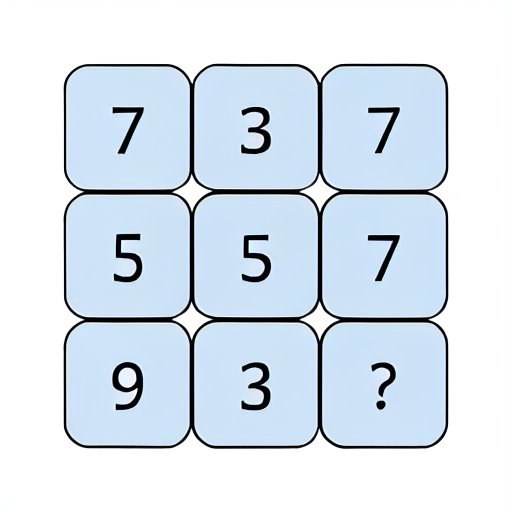

What is the missing number of the part denoted with a question mark?

# Options:
(A) 7
(B) 9
(C) 1
(D) 5

# Pattern:
There are 7 rectangles in the image with different colors and lengths. The colors remain constant [0, 'blue', 'blue', 'yellow', 'yellow', 'blue']. The lengths also follow a pattern [7, 3, 3, 1, 7, 0]. We observe that the numbers 7 and 7 are the numbers of rectangles of the same color. Similarly, the numbers 1 and 9 are the numbers of rectangles of the same color. Hence, the pattern is that the numbers 7 and 1 are the numbers of rectangles of the same color.

# Option A
Replacing '?' with 7: 


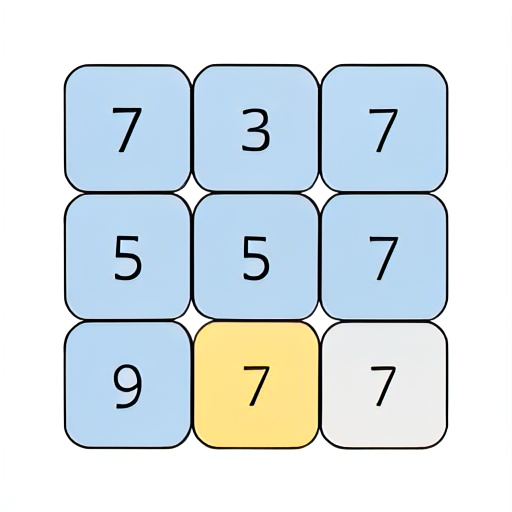


Reasoning: Comparing the number of rectangles of the same color, it does not fit the observed pattern. 7 is unlikely to be the correct answer.

# Option B
Replacing '?' with 9: 


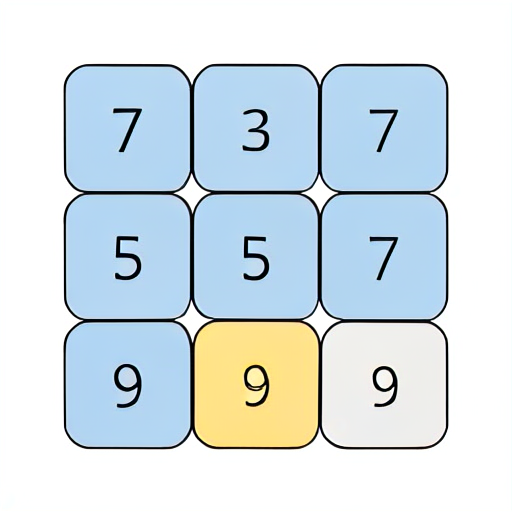


Reasoning: Comparing the number of rectangles of the same color, it does not fit the observed pattern. 9 is unlikely to be the correct answer.

# Option C
Replacing '?' with 1: 


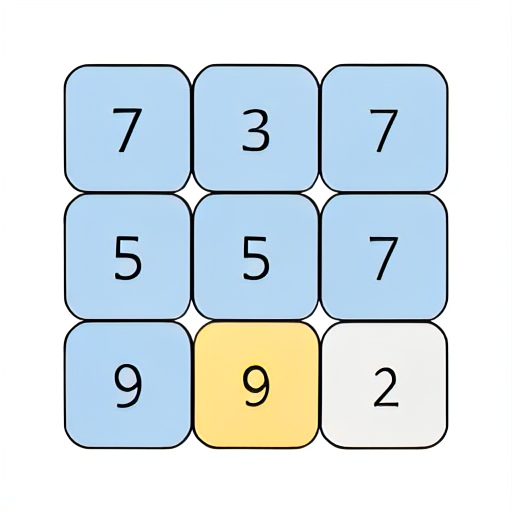


Reasoning: Comparing the number of rectangles of the same color, it does not fit the observed pattern. 1 is unlikely to be the correct answer.

# Option D
Replacing '?' with 5: 


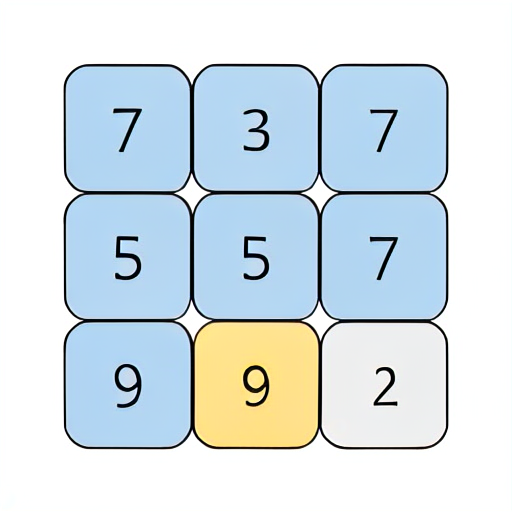


Reasoning: Comparing the number of rectangles of the same color, it matches well the pattern. 5 is a strong candidate for the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is 5. The pattern that the numbers in the rectangles holds consistently when we replace '?' with 5. Therefore, among (A) (B) (C) (D), the answer is: (D).


In [51]:
generate_and_decode('grid_number')

### shape_morph

# Question:



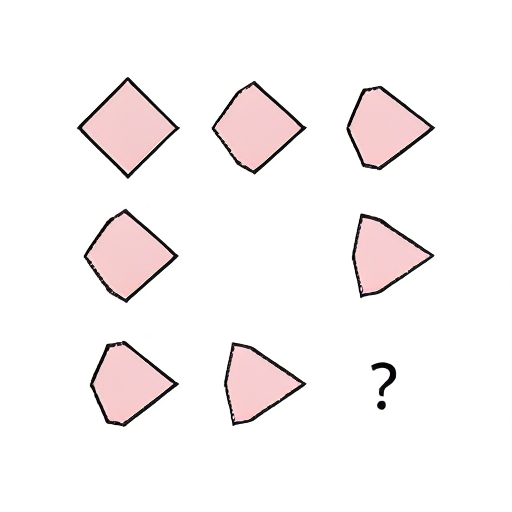

What is the missing shape of the part denoted with a question mark?

# Options:
(A) triangle
(B) hexagon
(C) square
(D) pentagon

# Pattern:
There are 7 rectangles in the image with varying sizes. The shapes in the sides are [('?', ('circle', 'squ')), ('pink triangle', ('circle', 'squan')), ('pink', ('square', 'squan')), ('purple', ('square', 'squan')), ('gray', ('rectangle', 'rectangle')), ('yellow', ('triangle', 'triangle')), ('blue', ('circle', 'square'))]. We observe that the shapes in the sides are a triangle and a square. Hence, the pattern is that the shape in the side is a triangle and the shape in the is a square.

# Option A
Replacing '?' with triangle: 


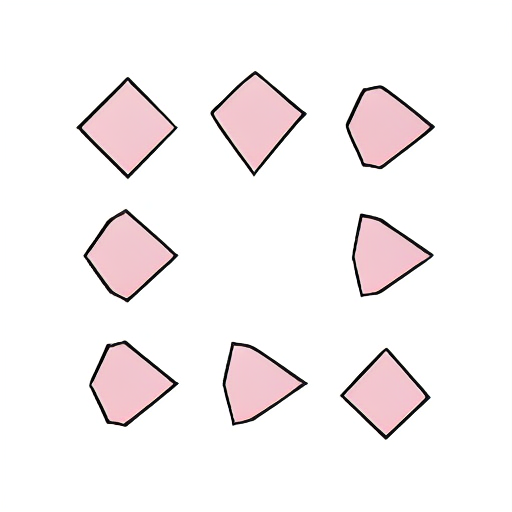


Reasoning: Comparing the
# Option B
Replacing '?' with hexagon: 


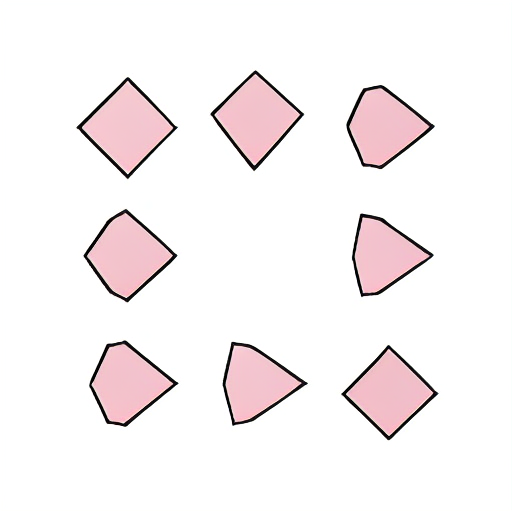


Reasoning: Comparing the amount of rectangles in each photo

# Option C
Replacing '?' with square: 


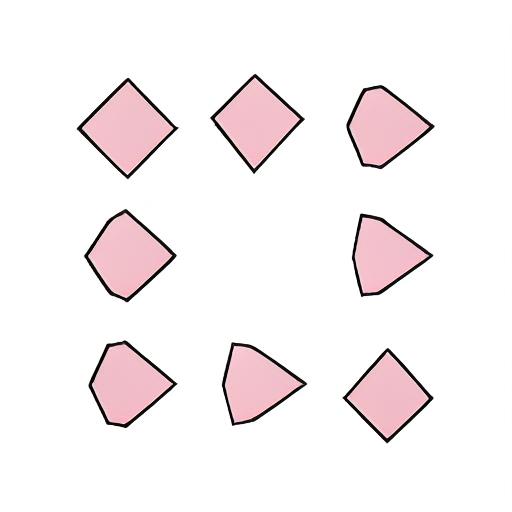


Reasoning: Comparing the number of rectangles in each photo։


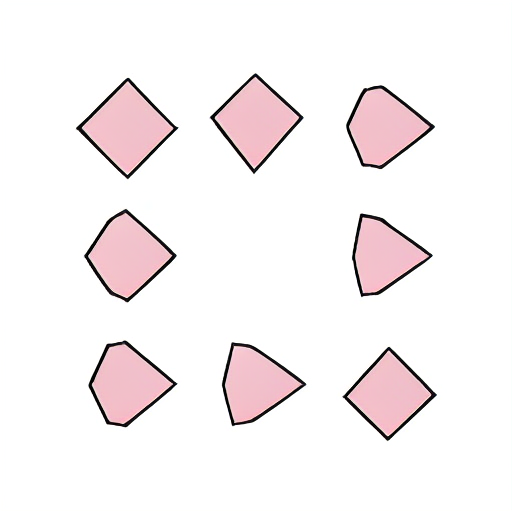


Reasoning: Comparing the number of rectangles in each photo։


AssertionError: 

In [52]:
generate_and_decode('shape_morph')

### shape_size_hexagon

# Question:



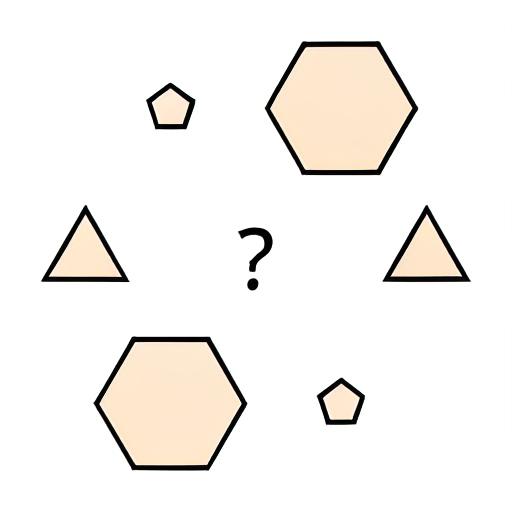

What is the size of the missing shape denoted with a question mark if it is a pentagon?

# Options:
(A) small
(B) large
(C) medium

# Pattern:
There are 7 rectangles in the image with varying sizes. We observe that the sizes in the order of [('?'), (''), (''), ('sunglasses'), ('sunglasses'), ('s'), ('s')]. Thus, the pattern is that the size of the rectangle is a number of stars in the missing shape.

# Option A
Replacing '?' with small: 


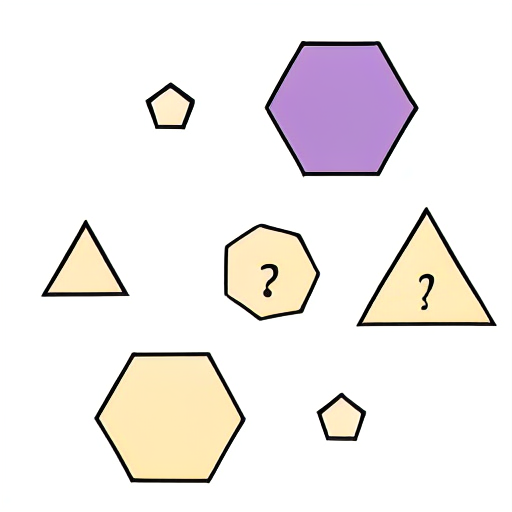


Reasoning: Comparing the size of the shapes in the
Reason/ OperDisassembling DisassembledDisassembledolding DisassembledNádkovdistant themselves��COPYきMicroMicroMicroMicro�صفحهMicro glimpAgFootball abstract� suspicoin� suspicoin�ád�ád


In [53]:
generate_and_decode('shape_size_hexagon')

### color_grid

# Question:



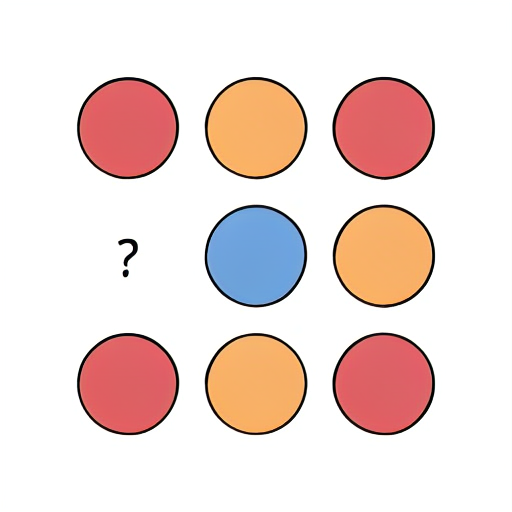

What is the color of the missing part denoted with a question mark?

# Options:
(A) green
(B) red
(C) orange
(D) yellow

# Pattern:
There are 7 rectangles in the image with varying colors and lengths. The lengths from left to right are ['long', 'medium', 'medium', 'long', 'short', 'short', 'medium']. The colors from left to right are ['red', 'orange', 'orange', 'red', 'blue', 'blue', '?']. We observe that the red rectangles are of long length and the blue rectangles are of short length. Hence, the pattern is that the color of each rectangle corresponds to its length.

# Option A
Replacing '?' with green: 


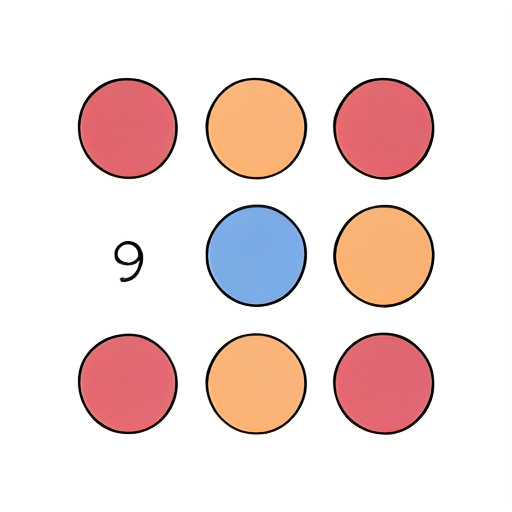


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. green is unlikely to be the correct answer.

# Option B
Replacing '?' with red: 


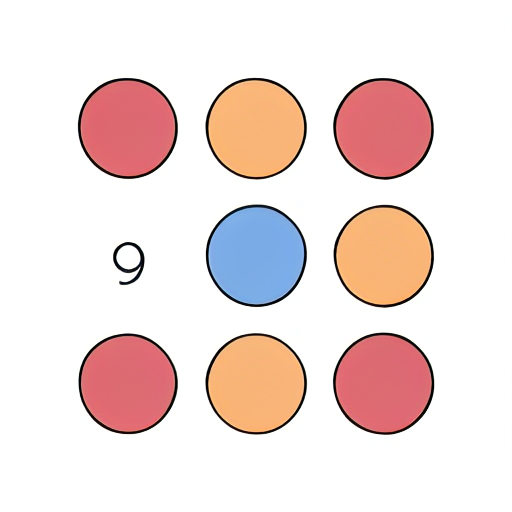


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. red is unlikely to be the correct answer.

# Option C
Replacing '?' with orange: 


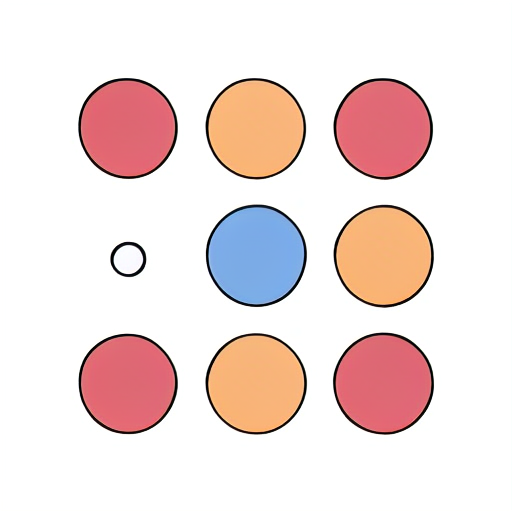


Reasoning: Comparing the color of each rectangle to its length, it matches well the color-length pattern. orange is a strong candidate for the correct answer.

# Option D
Replacing '?' with yellow: 


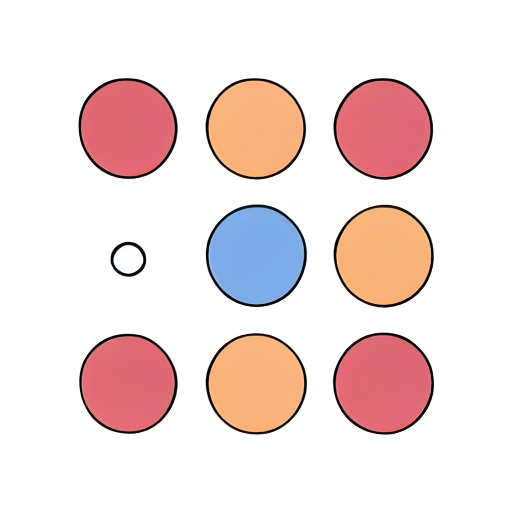


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. yellow is unlikely to be the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is orange. The pattern that the color of each rectangle corresponds to its length holds consistently when we replace '?' with orange. Therefore, among (A) (B) (C) (D), the answer is: (C).


In [55]:
generate_and_decode('color_grid')

### color_overlap_squares

# Question:



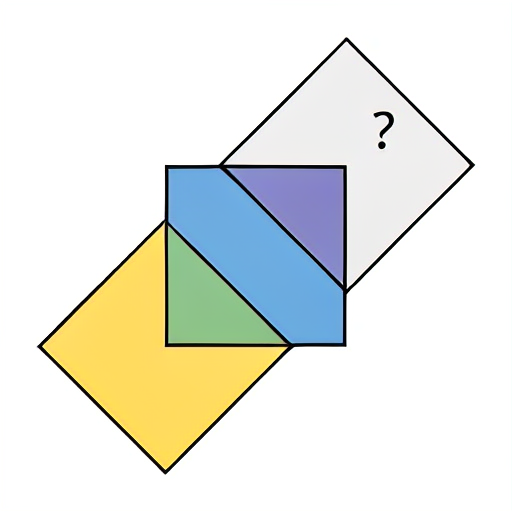

What is the missing color of the part denoted with a question mark?

# Options:
(A) green
(B) purple
(C) red
(D) yellow

# Pattern:
There are 7 rectangles in the image with varying colors and lengths. The lengths from left to right are ['medium', 'medium', 'long', 'long', 'short', 'short', 'medium']. The colors from left to right are ['blue', 'blue', 'green', 'green', 'yellow', 'yellow', '?']. We observe that the yellow rectangles are of short length and the green rectangles are of long length. Hence, the pattern is that the color of each rectangle corresponds to its length.

# Option A
Replacing '?' with green: 


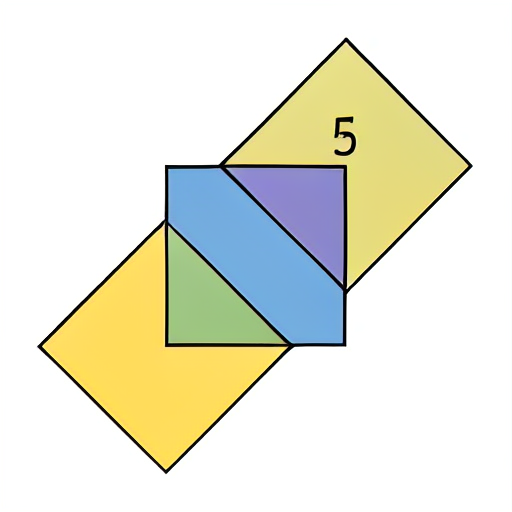


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. green is unlikely to be the correct answer.

# Option B
Replacing '?' with purple: 


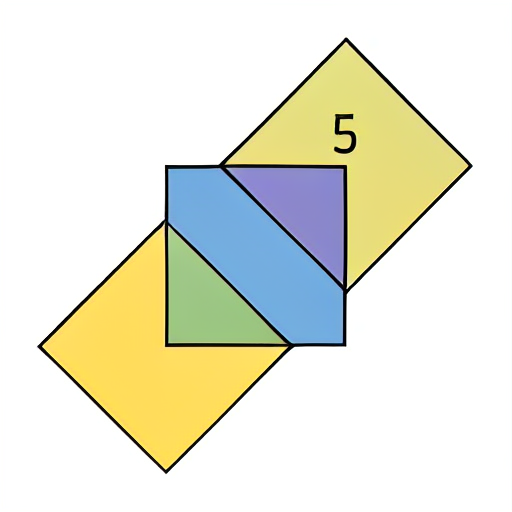


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. purple is unlikely to be the correct answer.

# Option C
Replacing '?' with red: 


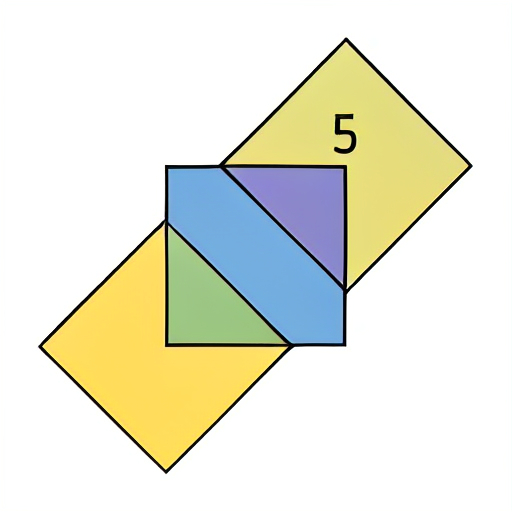


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. red is unlikely to be the correct answer.

# Option D
Replacing '?' with yellow: 


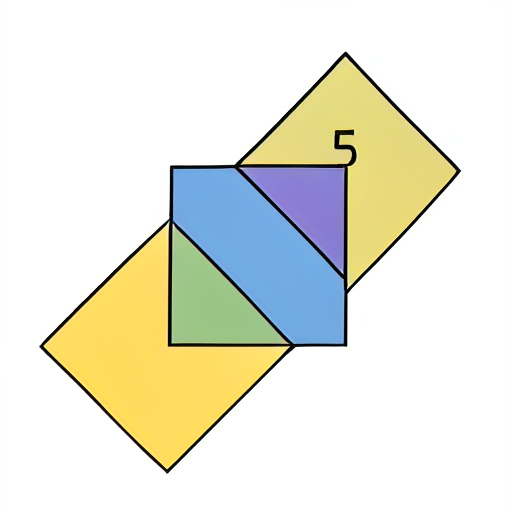


Reasoning: Comparing the color of each rectangle to its length, it matches well the color-length pattern. yellow is a strong candidate for the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is yellow. The pattern that the color of each rectangle corresponds to its length holds consistently when we replace '?' with yellow. Therefore, among (A) (B) (C) (D), the answer is: (D).


In [56]:
generate_and_decode('color_overlap_squares')

### shape_reflect

# Question:



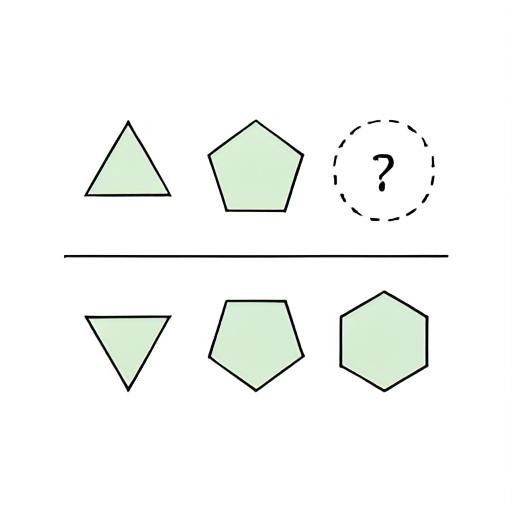

What is the missing shape denoted by a question mark?

# Options:
(A) pentagon
(B) square
(C) hexagon
(D) triangle

# Pattern:
There are 7 rectangles in the image with varying colors and shapes. The colors remain constant [either green or purple] while the shapes vary [either triangle, square,,, or '?']. We observe that the shapes in the rectangles are either triangle, square, hexagon, or oval. Similarly, the shapes in the missing shape also belong to the same pattern. Thus, the pattern is that the shapes are either triangle, square, oval, or rectangles.

# Option A
Replacing '?' with pentagon: 


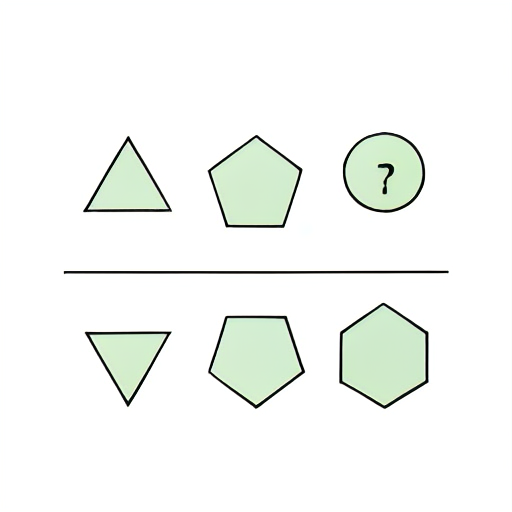


Reasoning: Comparing the sum of the shapes in the
Reasoning: Summing the shapes of each group: 2 (x). Matching the shade of the


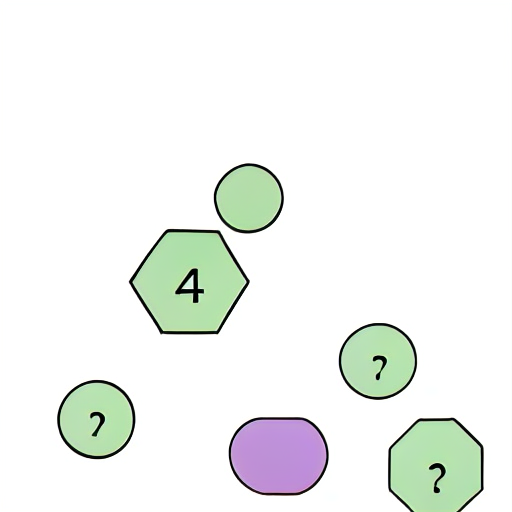


Reasoning: Summing the shades of the shapes: 2 (x).

꯳�What is the missing color/shape?

# Option A

Replacing '?' with pianist: ''.
                                                                                                            This does not fit the pattern, '' (x) '' is not a valid answer for the missing color.

# Option B

Replacing '?' with square: 
                                                                    Absolutely certain about the pattern. '(x)' is a strong and consistent pattern.Excellent choice, the answer is (x).

# Option C

Replacing '?' with purple: 
                    Missing color/shape: 'yellow'.                            Wrong: 'yellow' is not a valid answer for the missing color. the pattern does not work with 'yellow'.

# Option D

Replacing '?' with triangle: 
                                                                                        '.' is the's's's pattern, it is a strong and consistent-style reasoning. '(x)' is the answer to

In [57]:
generate_and_decode('shape_reflect')

### size_cycle

# Question:



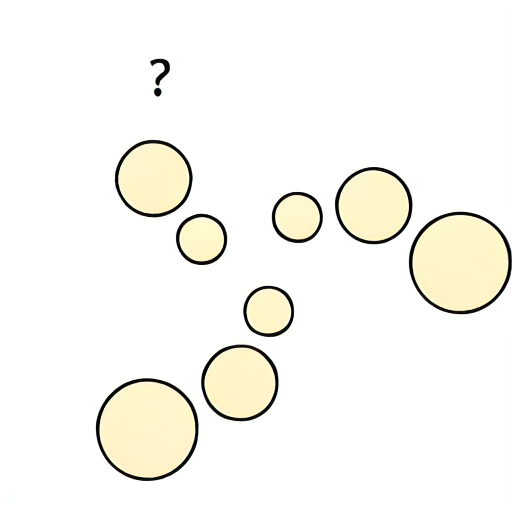

What is the size of the missing circle denoted with a question mark?

# Options:
(A) large
(B) small
(C) medium

# Pattern:
There are 7 rectangles in the image with varying colors and sizes. The sizes of the rectangles are [('yellow', 'large'), ('yellow', 'medium'), ('black', 'medium'), ('white', 'small'), What is theadierádWhat is the missing color among these colors that are represented in theWhat color isThe color that is missing among the colors represented in the images is yellow. Among the remaining colors, the color patterns in the images is the answer to the question. The images are arranged in a grid pattern with either yellow or white colors. The color patterns are not consistent among the colors. The color palette of the images is yellow, white, yellow, blue, blue, yellow, blue, and blue. The color yellow is the missing color among these colors.The color patterns of the images are not consistent. None of the side-by-side pairs of colors is either yellow or blue. Among the re

In [58]:
generate_and_decode('size_cycle')

### venn

# Question:



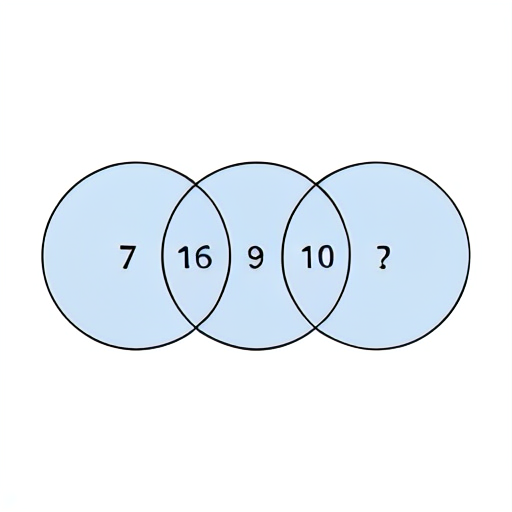

What is the missing number of the part denoted with a question mark?

# Options:
(A) 4
(B) 8
(C) 1
(D) 9

# Pattern:
There is a hexagon split into six parts with the numbers [7, '?', 7, 1, 4, 3] in an anti-clockwise order. We observe that the number 7 is the sum of the numbers 1 and 4. Similarly, the number 3 is the sum of the number 4 and 1. Hence, the pattern is that the rightmost number is the sum of the numbers 1 and 4.

# Option A
Replacing '?' with 4: 


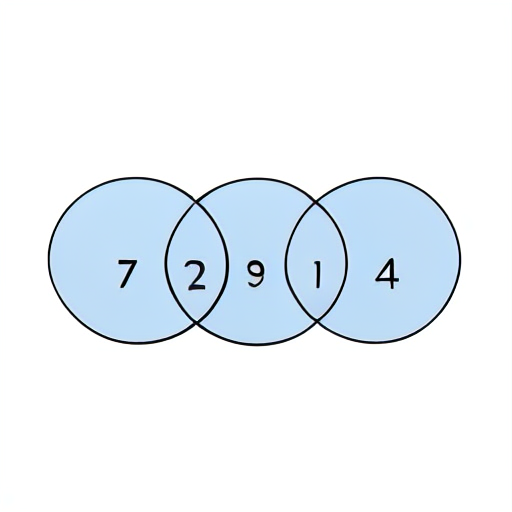


Reasoning: Comparing the rightmost number of each part to the sum of the numbers 1 and 4, the correct answer is 4. the pattern is that the rightmost number is the sum of the numbers 1 and 4.

# Option B
Replacing '?' with 8: 


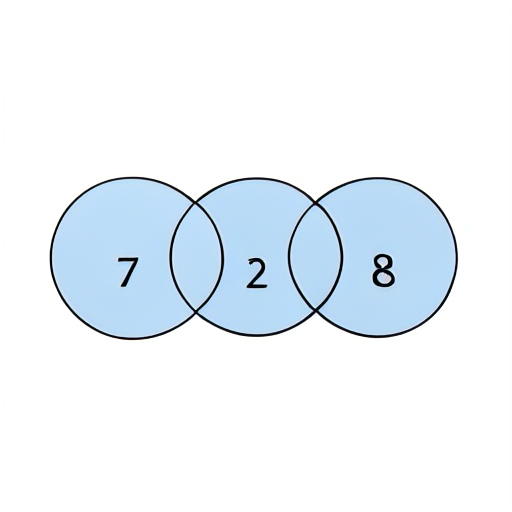


Reasoning: Comparing the rightmost number of each part to the sum of the numbers 1 and 4, the correct answer is 8. There is a consistent pattern that the rightmost number is the sum of the numbers 1 and 4.

# Option C
Replacing '?' with 1: 


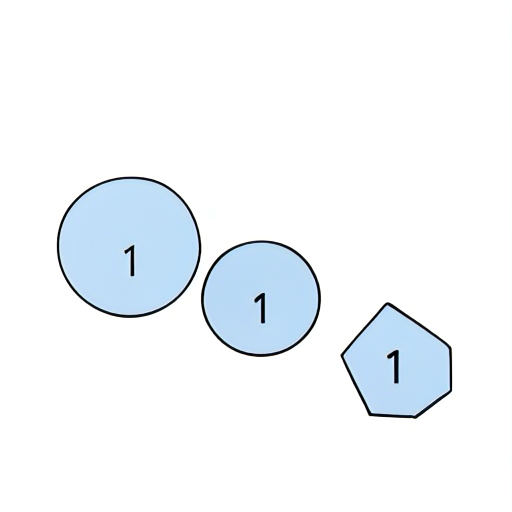


Reasoning: Comparing the rightmost number of each part to the sum of the numbers 1 and 4, the correct answer is 1. There is a consistent pattern that the rightmost number is the sum of the numbers 1 and 4.

# Option D
Replacing '?' with 9: 


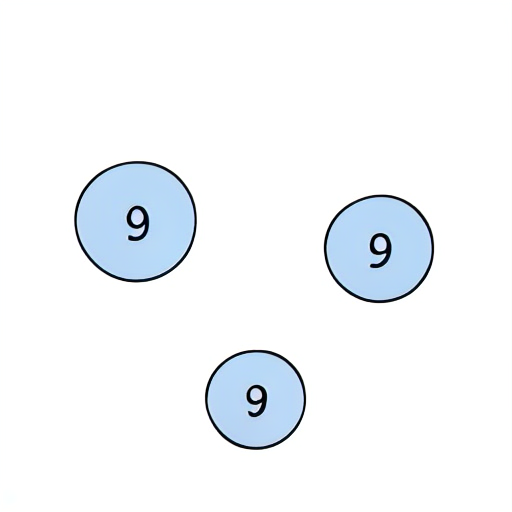


Reasoning: Comparing the rightmost number of each part to the sum of the numbers 1 and 4, the correct answer is 9. There is a consistent pattern that the rightmost number is a simple number-to-number.

# Reasoning Process:

1. uthors' reasoning:
We observe that the rightmost number in each part is a sum of the numbers  


In [59]:
generate_and_decode('venn')

### color_hexagon

# Question:



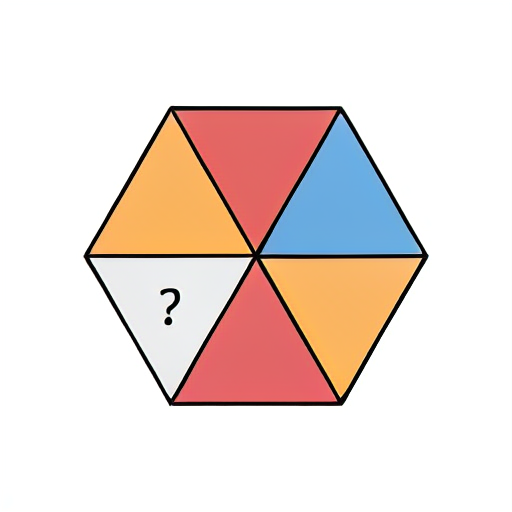

What is the missing color of the part denoted with a question mark?

# Options:
(A) yellow
(B) purple
(C) blue
(D) orange

# Pattern:
There are 7 rectangles in the image with varying colors and lengths. The lengths from left to right are ['long', 'medium', 'medium', 'short', 'short', 'long', 'medium']. The colors from left to right are ['red', 'orange', 'orange', 'yellow', 'yellow', 'red', '?']. We observe that the red rectangles are of long length and the yellow rectangles are of short length. Hence, the pattern is that the color of each rectangle corresponds to its length.

# Option A
Replacing '?' with yellow: 


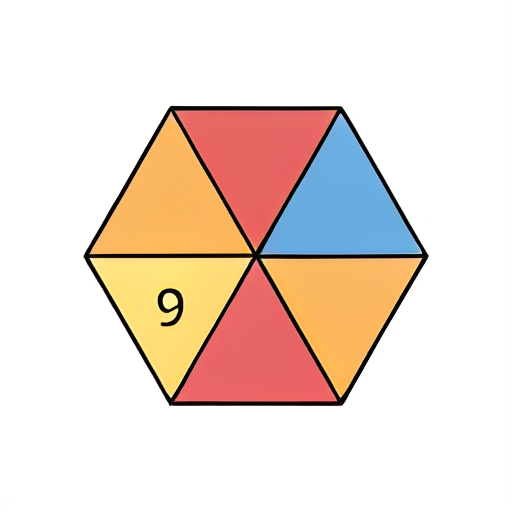


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. yellow is unlikely to be the correct answer.

# Option B
Replacing '?' with purple: 


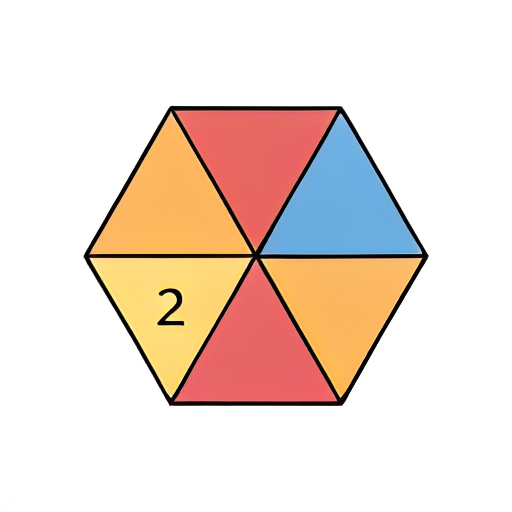


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. purple is unlikely to be the correct answer.

# Option C
Replacing '?' with blue: 


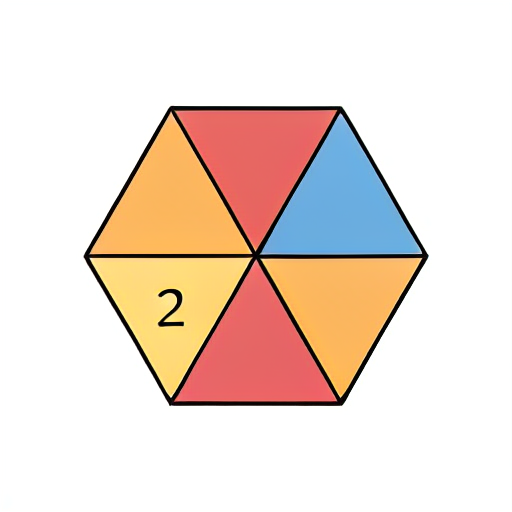


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. blue is unlikely to be the correct answer.

# Option D
Replacing '?' with orange: 


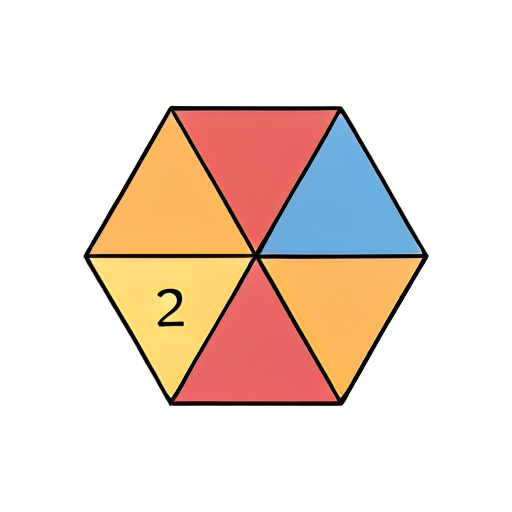


Reasoning: Comparing the color of each rectangle to its length, it matches well the color-length pattern. orange is a strong candidate for the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is orange. The pattern that the color of each rectangle corresponds to its length holds consistently when we replace '?' with orange. Therefore, among (A) (B) (C) (D), the answer is: (D).


In [60]:
generate_and_decode('color_hexagon')

### color_size_circle

# Question:



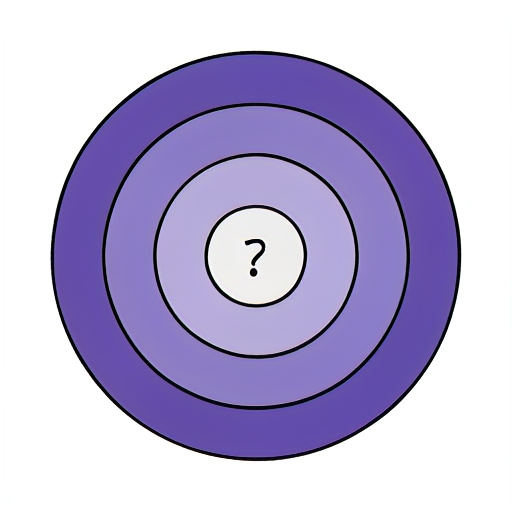

What is the missing color of the part denoted with a question mark?

# Options:
(A) dark green
(B) light purple
(C) light blue
(D) dark purple

# Pattern:
There is a 1/1 relationship between the number of the missing color and the symbol for themissing color. The number on the top right corner indicates that the missing color is a hard-core number, which means the color is not a softsoft number What is the color of themissing piece?

# Options:
(A) blue
(B: purple
(C: green
(D: red

♂️ Symbol:
There is a ibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibibib

In [61]:
generate_and_decode('color_size_circle')

### polygon_sides_color

# Question:



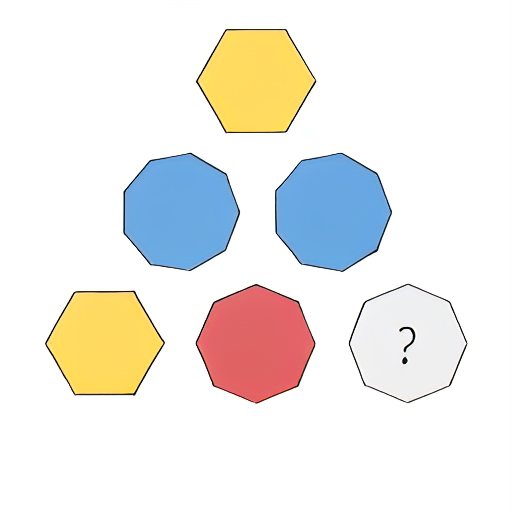

What is the missing color of the part denoted with a question mark?

# Options:
(A) red
(B) purple
(C) blue
(D) orange

# Pattern:
There are 7 rectangles in the image with varying colors and lengths. The lengths from left to right are ['long', 'medium', 'short', 'medium', 'short', 'long', 'medium']. The colors from left to right are ['yellow', 'blue', 'orange', 'blue', 'orange', 'yellow', '?']. We observe that the yellow rectangles are of long length and the orange rectangles are of short length. Hence, the pattern is that the color of each rectangle corresponds to its length.

# Option A
Replacing '?' with red: 


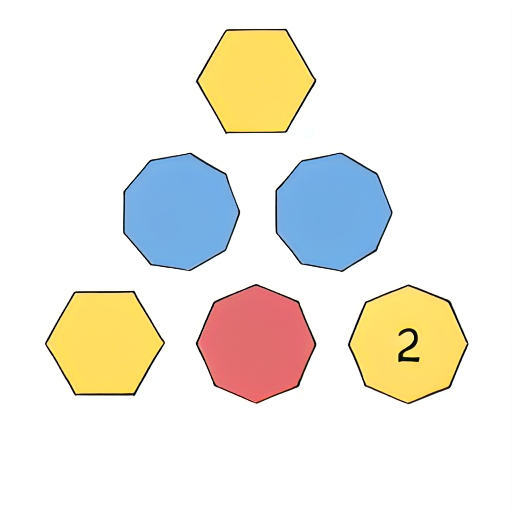


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. red is unlikely to be the correct answer.

# Option B
Replacing '?' with purple: 


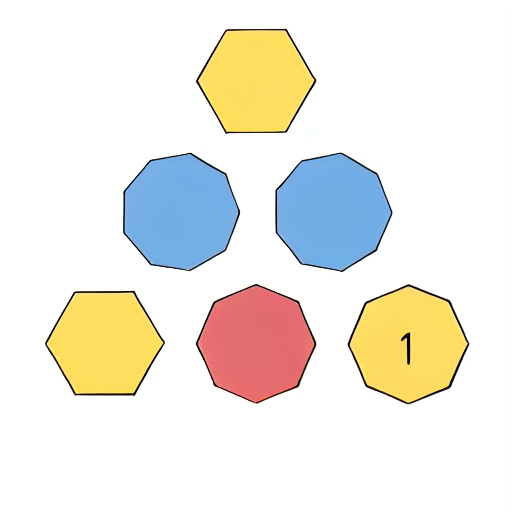


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. purple is unlikely to be the correct answer.

# Option C
Replacing '?' with blue: 


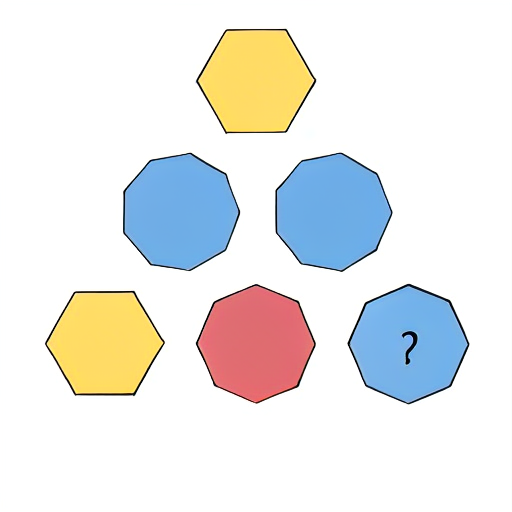


Reasoning: Comparing the color of each rectangle to its length, it does not fit the observed color-length pattern. blue is unlikely to be the correct answer.

# Option D
Replacing '?' with orange: 


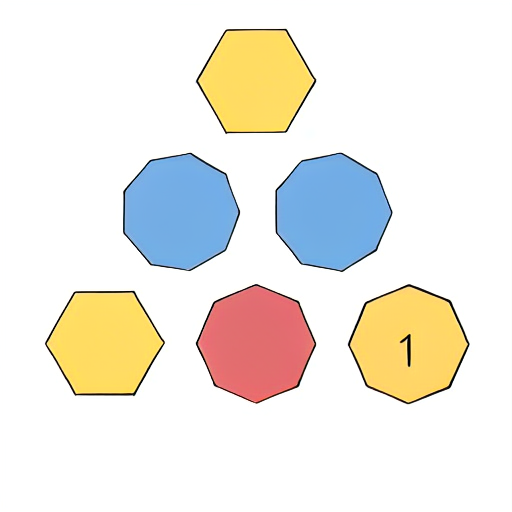


Reasoning: Comparing the color of each rectangle to its length, it matches well the color-length pattern. orange is a strong candidate for the correct answer.

# Final Answer:
Based on the reasoning process, the best fit for the missing number is orange. The pattern that the color of each rectangle corresponds to its length holds consistently when we replace '?' with orange. Therefore, among (A) (B) (C) (D), the answer is: (D).


In [62]:
generate_and_decode('polygon_sides_color')

### rectangle_height_number

# Question:



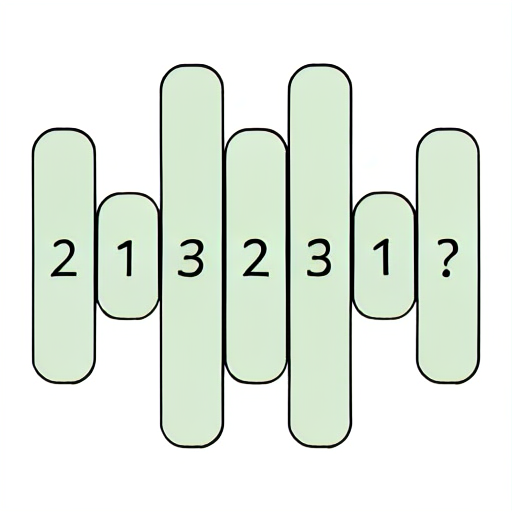

What is the missing number of the part denoted with a question mark?

# Options:
(A) 4
(B) 2
(C) 1
(D) 3

# Pattern:
There are 7 rectangles in the image with varying colors and lengths. The lengths from left to right are [2, 1, 3, 0, 1, 1, 0]. We observe that the lengths in the rows are constant and equal to 0, 1, 0, respectively. Similarly, the colors in the rectangles also constitute a pattern. The colors in the rectangles are ['green', 'green', 'white', 'red']. Thus, the pattern is that the lengths in the rectangles are constant and the colors are either 'green' or 'red'.

# Option A
Replacing '?' with 4: 


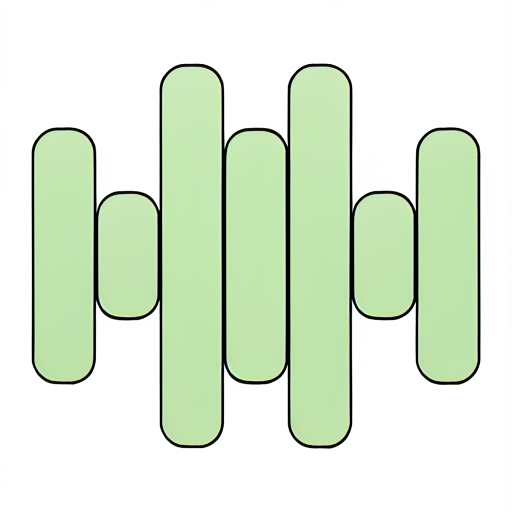


Reasoning: Comparing the color of each rectangle to the color of its neighbor in the pattern, it does not fit the color-length rule. 4 is unlikely to be the correct answer.

# Option B
Replacing '?' with 2: 


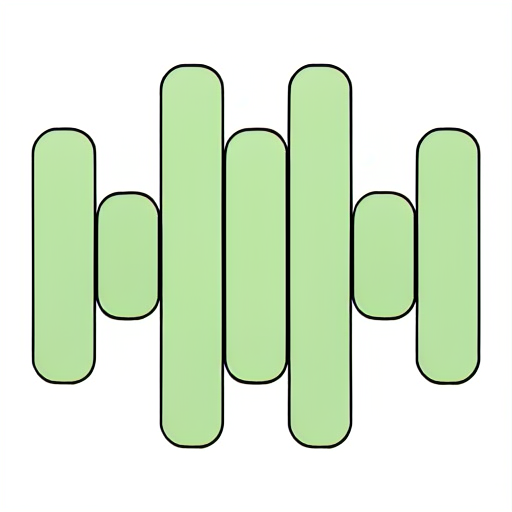


Reasoning: Comparing the number of rectangles with the number of colors it And finally, we observe the pattern that rectangles of color uthors--- (A) ۰։ The explanation matches the pattern well. The number of rectangles is a strong indicator of our answer. It is a strong candidate for the correct answer. ۰‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏‏

In [63]:
generate_and_decode('rectangle_height_number')

### shape_size_grid

# Question:



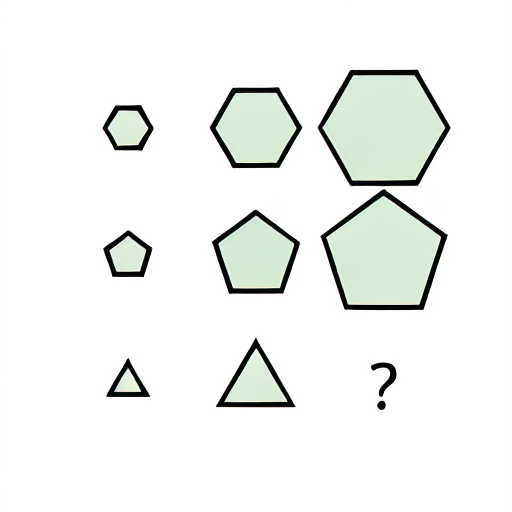

What is the size of the missing part denoted by a question mark?

# Options:
(A) medium
(B) large
(C) small

# Pattern:
There are 7 rectangles in the image with varying colors and sizes. The sizes of the rectangles are [('green', 'large'), ('green', 'medium'), ('white', 'shocking'), ('blue', 'shallow'), ('yellow', 'medium'), ('black', 'shallow'), ('red', 'medium')]. We observe that the sizes of the rectangles are random in nature. Similarly, the colors of the rectangles are also random. There is a pattern that the rectangles with green rectangles have a'green' color. Similarly, the rectangles with shaded area are sh color. Unfortunately, there is no sh pattern observable for the size-shaded area pair.

# Option A
Replacing '?' with medium: 


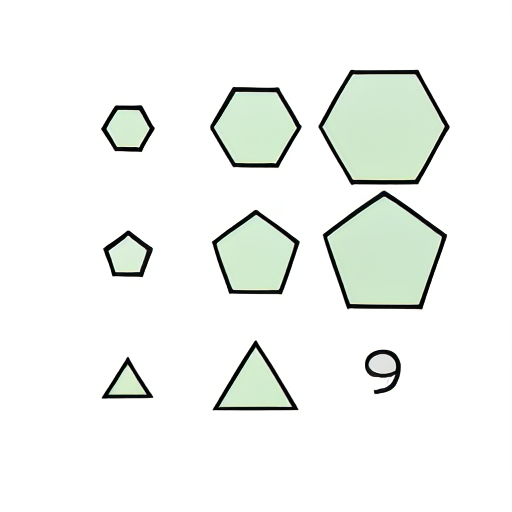


Reasoning: Comparing the color of the rectangles, it does not fit the observed color-size pattern. the rectangles with the medium-colored area is unlikely to be medium in size.

# Option B
Replacing '?' with large: 


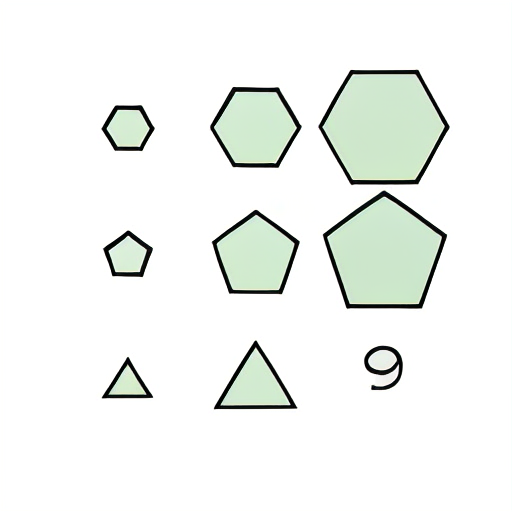


Reasoning: Comparing the color of the rectangles, it matches well the color-size pattern. the rectangles with a large area is likely to be a large area.

# Option C
Replacing '?' with small: 


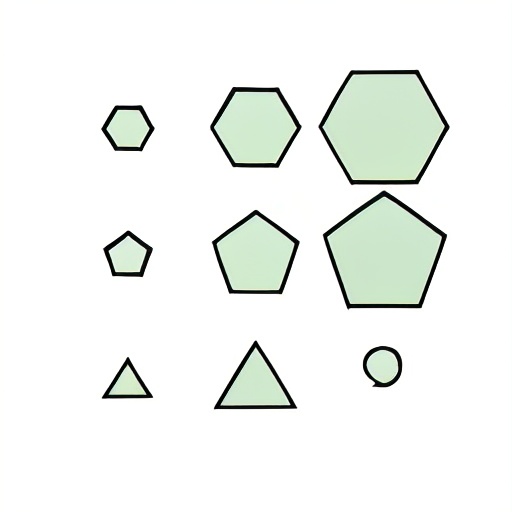


Reasoning: Comparing the color of the rectangles, it does not fit the observed color-size pattern. the rectangles with a small area is unlikely to be a small area.

# Option D
Replacing '?' with small: 


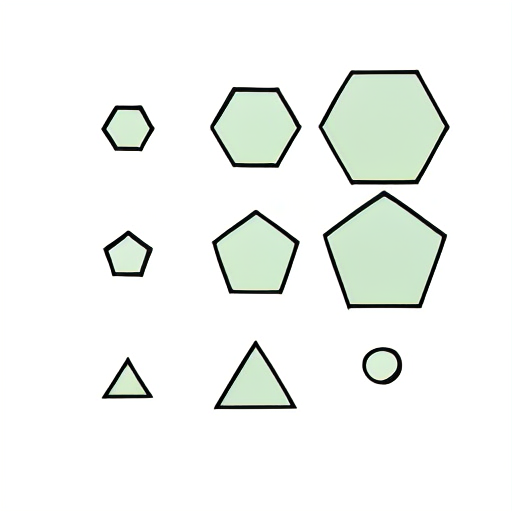


Reasoning: Comparing the color of the rectangles, it does not fit the observed color-size pattern. the rectangles with a small area is unlikely to be a small area.

# Process
Simply listing the names of the regions '♂️' they they they they they they ۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔۔'?': 'M': The pattern: clustering: 'm' mm mm mm mm. constellation: '?': 2-lunch 2-lunch 2-lunch 2-lunch 2-lunch. Therefore, among '♂️' 'm'm'm'm', the best fit for the missing number is 2. The reasoning is that we a pattern that the rectangles with the same color, 'm', have the same size. '♂️': 'M': 2: 2: 'm': m: 'm'. Therefore, the answer is: 2. We the pattern that the rectangles with the same color will be the answer.


In [64]:
generate_and_decode('shape_size_grid')

### size_grid

# Question:



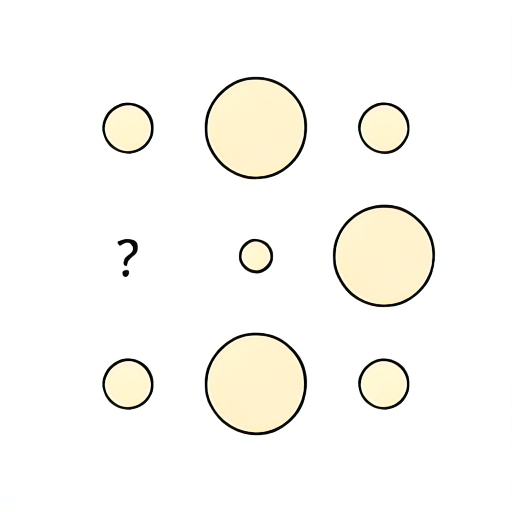

What is the size of the missing part denoted with a question mark?

# Options:
(A) small
(B) large
(C) medium

# Pattern:
There are 7 rectangles in the image with varying colors and sizes. The sizes of the rectangles are [('?', 'large'), ('yellow', ('orange', 'yellow')), ('orange', ('yellow', 'orange')), What is theWhat is the color of the missing piece?

# Options:
(A) white
(B: yellow
(C: blue
(D: black

: The image is a grid of rectangles with numbers. The numbers on the rectangles are: Rog suspicRogRogFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQFBQ

In [65]:
generate_and_decode('size_grid')